
# Assignment 4

This is a template notebook for Assignment 4.


## Install dependencies and initialization

In [1]:
# import some common libraries
# from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()
import matplotlib.pyplot as plt


In [2]:
# Make sure that GPU is available for your notebook.
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [3]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
BASE_DIR = './'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [4]:
'''
# This function should return a list of data samples in which each sample is a dictionary.
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''

def get_detection_data(set_name):
    
    data_dir = os.path.join(BASE_DIR, 'data', set_name)
    dataset = []
    annotation_file = os.path.join(BASE_DIR, 'data', "train.json")

    # Load annotations if not test
    if set_name != 'test':
        with open(annotation_file, 'r') as f:
            annotations = json.load(f)

        # Group annotations by file name
        file_to_annotations = {}
        for anno in annotations:
            file_name = anno["file_name"]
            if file_name not in file_to_annotations:
                file_to_annotations[file_name] = []
            file_to_annotations[file_name].append(anno)
        
    for filename in os.listdir(data_dir):
        if filename.endswith(('.jpg', '.png', '.jpeg')):
            img_path = os.path.join(data_dir, filename)
            
            with Image.open(img_path) as img:
                width, height = img.size
            
            sample = {
                "file_name": img_path,
                "image_id": int(os.path.splitext(filename)[0].lstrip('P')),
                "height": height,
                "width": width,
                "annotations": []
            }

            if set_name != 'test' and filename in file_to_annotations:
                # Get the annotation by the file name
                for anno in file_to_annotations[filename]:
                    bbox = anno.get("bbox")
                    if bbox is None and "segmentation" in anno and anno["segmentation"]:
                        seg = anno["segmentation"][0]
                        x_coords = seg[0::2]
                        y_coords = seg[1::2]
                        bbox = [
                            min(x_coords), min(y_coords),
                            max(x_coords) - min(x_coords),
                            max(y_coords) - min(y_coords)
                        ]

                    sample["annotations"].append({
                        "bbox": bbox,
                        "bbox_mode": BoxMode.XYWH_ABS,
                        "category_id": 0, # Plane is the only category
                        "category_name": anno["category_name"],
                        "segmentation": anno['segmentation']
                    })
            
            dataset.append(sample)
    
    return dataset

In [5]:
import shutil
def split_train_val(val_ratio=0.2, seed=1):
    data_dir = os.path.join(BASE_DIR, 'data')
    train_dir = os.path.join(data_dir, "train")
    val_dir = os.path.join(data_dir, "val")
    
    try:
        os.makedirs(val_dir, exist_ok=False)
    except:
        return

    image_files = [f for f in os.listdir(train_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

    # Randomize the images and split into train and val sets
    random.seed(seed)
    random.shuffle(image_files)
    val_count = int(len(image_files) * val_ratio)
    val_files = image_files[:val_count]

    # Move val images to the val folder
    for file_name in val_files:
        src_path = os.path.join(train_dir, file_name)
        dest_path = os.path.join(val_dir, file_name)
        shutil.move(src_path, dest_path)

split_train_val(val_ratio=0.15)

In [6]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''
thing_classes = ["plane"]
# DatasetCatalog.remove("data_detection_train")
DatasetCatalog.register("data_detection_train", lambda: get_detection_data("train"))
MetadataCatalog.get("data_detection_train").set(thing_classes=thing_classes)  # Replace with actual class names

# DatasetCatalog.remove("data_detection_test")
DatasetCatalog.register("data_detection_test", lambda: get_detection_data("test"))
MetadataCatalog.get("data_detection_test").set(thing_classes=thing_classes)

# DatasetCatalog.remove("data_detection_val")
DatasetCatalog.register("data_detection_val", lambda: get_detection_data("val"))
MetadataCatalog.get("data_detection_val").set(thing_classes=thing_classes)


namespace(name='data_detection_val', thing_classes=['plane'])

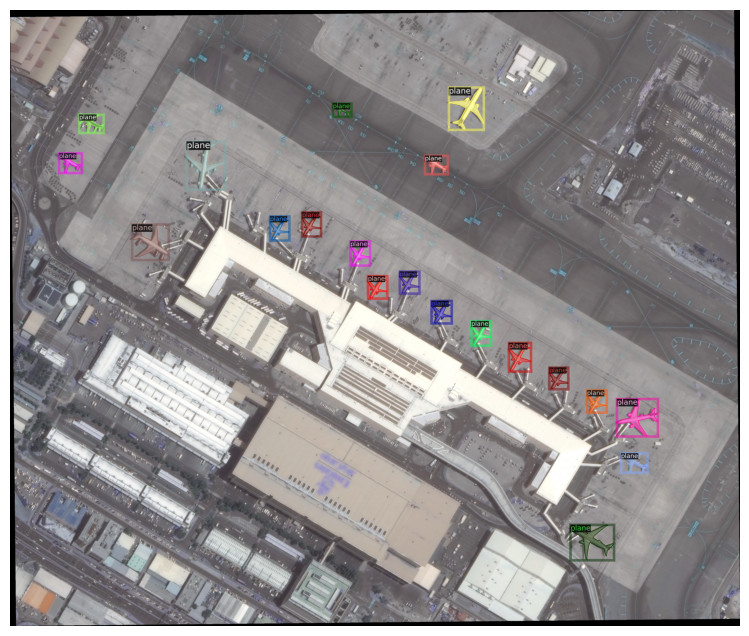

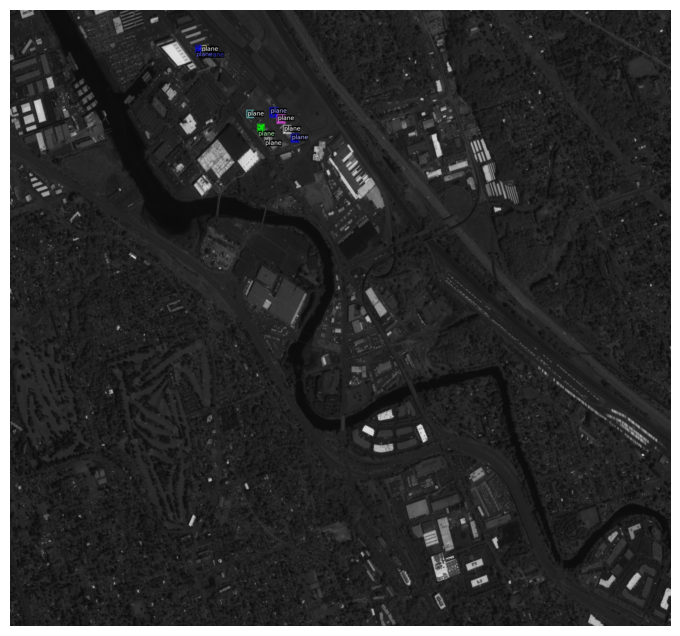

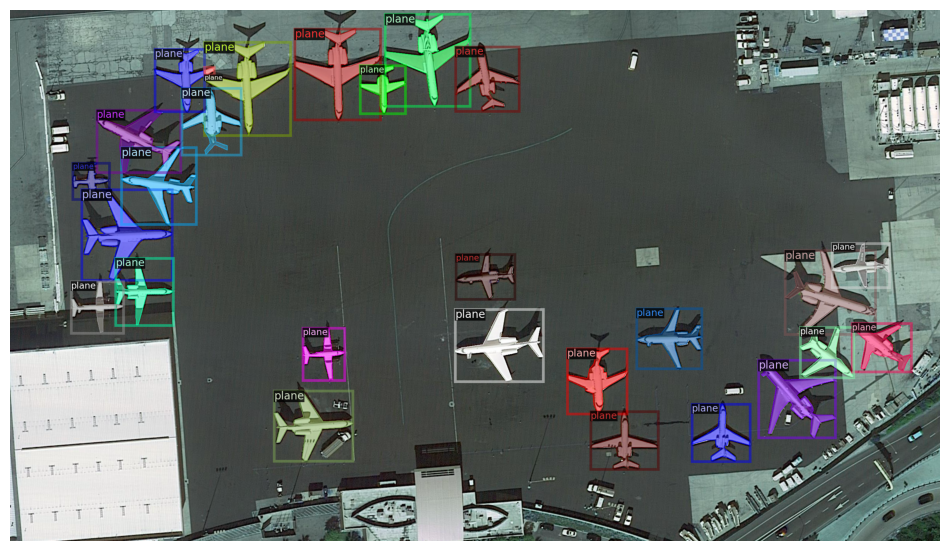

In [7]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''
dataset = DatasetCatalog.get("data_detection_train")
metadata = MetadataCatalog.get("data_detection_train")

for sample in random.sample(dataset, 3):
        
    img = cv2.imread(sample["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    visualizer = Visualizer(img, metadata=metadata)
    vis = visualizer.draw_dataset_dict(sample)

    plt.figure(figsize=(12, 8))  # Set the figure size
    plt.imshow(vis.get_image()[:, :, ::-1])  # Convert image back from BGR to RGB
    plt.axis("off")  # Hide axes for better visualization
    plt.show()

### Set Configs

In [8]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)

cfg.merge_from_file("{}/config/faster_rcnn_R_101_FPN_3x.yaml".format(BASE_DIR))
cfg.SOLVER.MAX_ITER = 2000
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.BATCH_SIZE_PER_IMAGE = 128
cfg.SOLVER.WEIGHT_DECAY = 0.0001
# Learning rate decay schedule
cfg.SOLVER.LR_SCHEDULE = "steps"
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.STEPS = (1000, 1600)
cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.WARMUP_METHOD = "linear"

cfg.MODEL.ROI_HEADS.NMS_THRESH = 0.5  # NMS threshold

cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ("data_detection_val",)

# Data Augmentation
cfg.INPUT.RANDOM_FLIP = "horizontal"  # Apply horizontal flip
# cfg.INPUT.MAX_SIZE_TRAIN = 1333  # Maximum size of the longer edge
cfg.INPUT.CROP.ENABLED = True  # Enable cropping
cfg.INPUT.CROP.TYPE = "relative_range"  # Crop type
cfg.INPUT.CROP.SIZE = [0.5, 0.5]  # Relative crop size

cfg.TEST.EVAL_PERIOD = 200
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6

In [34]:
cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)
cfg.merge_from_file("{}/config/faster_rcnn_R_101_FPN_3x.yaml".format(BASE_DIR))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ("data_detection_val",)

cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 200
cfg.SOLVER.WARMUP_METHOD = "linear"
cfg.SOLVER.MAX_ITER = 2000 #
cfg.SOLVER.STEPS = (1000, 1600)
cfg.SOLVER.GAMMA = 0.2
cfg.SOLVER.IMS_PER_BATCH = 2 # 
cfg.SOLVER.WEIGHT_DECAY = 0.0001

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5 #

# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[32, 64, 128, 256]]
# cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[1.0, 2.0]]

cfg.MODEL.ROI_HEADS.NMS_THRESH = 0.3
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3 #
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

# cfg.MODEL.BACKBONE.FREEZE_AT = 2  # Freeze more backbone layers
# cfg.MODEL.BACKBONE.GRADIENT_CHECKPOINTING = True
cfg.TEST.EVAL_PERIOD = 200

cfg.INPUT.RANDOM_FLIP = "horizontal"
cfg.INPUT.CROP.ENABLED = True
cfg.INPUT.CROP.TYPE = "relative_range"
cfg.INPUT.CROP.SIZE = [0.5, 0.5]

# cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
# cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "norm"
# cfg.SOLVER.CLIP_GRADIENTS.NORM_TYPE = 2.0

#cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_101_FPN_3x/model_final.pkl"

### Training

In [35]:
'''
# Create a DefaultTrainer using the above config and train the model
# TODO: approx 5 lines
'''
# from detectron2.data import build_detection_train_loader

# class CustomTrainer(DefaultTrainer):
#     @classmethod
#     def build_train_loader(cls, cfg):
#         return build_detection_train_loader(cfg, mapper=data_augment)

# # Use CustomTrainer for training
# trainer = CustomTrainer(cfg)
# trainer.resume_or_load(resume=False)
# trainer.train()
class TrainerWithValidation(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name):
        """
        Set up the evaluator for validation.
        """
        return COCOEvaluator(dataset_name, cfg, True, output_dir=cfg.OUTPUT_DIR)

    def __init__(self, cfg):
        """
        Initialize the trainer and set up validation at specified intervals.
        """
        super().__init__(cfg)
        self._val_loader = build_detection_test_loader(cfg, cfg.DATASETS.TEST[0])
    
    def run_step(self):
        """
        Run a training step and perform validation at intervals.
        """
        super().run_step()
        # Perform validation at specified intervals
        iteration = self.iter
        if iteration % self.cfg.TEST.EVAL_PERIOD == 0 and iteration != 0:
            self._validate()

    def _validate(self):
        """
        Run evaluation on the validation dataset.
        """
        evaluator = self.build_evaluator(self.cfg, self.cfg.DATASETS.TEST[0])
        results = inference_on_dataset(self.model, self._val_loader, evaluator)
        print(f"Validation Results at iteration {self.iter}: {results}")
# from detectron2.engine import HookBase
# class TrainerWithCustomLRAndValidation(DefaultTrainer):
#     @classmethod
#     def build_optimizer(cls, cfg, model):
#         """
#         Customize optimizer with different learning rates for backbone and detection head.
#         """
#         base_lr = cfg.SOLVER.BASE_LR

#         params = []
#         for name, param in model.named_parameters():
#             if not param.requires_grad:
#                 continue
#             if "backbone" in name:
#                 params.append({"params": [param], "lr": base_lr})
#             else:
#                 params.append({"params": [param], "lr": base_lr})

#         optimizer = torch.optim.AdamW(params, lr=base_lr, weight_decay=cfg.SOLVER.WEIGHT_DECAY)
#         return optimizer

#     @classmethod
#     def build_evaluator(cls, cfg, dataset_name):
#         """
#         Build a COCO evaluator for validation.
#         """
#         return COCOEvaluator(dataset_name, cfg, False, output_dir=cfg.OUTPUT_DIR)

#     def build_hooks(self):
#         """
#         Add hooks for validation and checkpointing.
#         """
#         hooks = super().build_hooks()
#         hooks.insert(-1, ValidationHook(self.cfg.TEST.EVAL_PERIOD, self.model, self.cfg))
#         return hooks


# class ValidationHook(HookBase):
#     """
#     A hook to run evaluation at specified intervals.
#     """
#     def __init__(self, eval_period, model, cfg):
#         self._eval_period = eval_period
#         self._model = model
#         self._cfg = cfg

#     def after_step(self):
#         """
#         Run evaluation after a specific number of iterations.
#         """
#         next_iter = self.trainer.iter + 1
#         if next_iter % self._eval_period == 0 or next_iter == self.trainer.max_iter:
#             evaluator = TrainerWithCustomLRAndValidation.build_evaluator(self._cfg, self._cfg.DATASETS.TEST[0])
#             val_loader = build_detection_test_loader(self._cfg, self._cfg.DATASETS.TEST[0])
#             results = inference_on_dataset(self._model, val_loader, evaluator)
#             print("Validation Results:", results)

trainer = TrainerWithValidation(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

# trainer = DefaultTrainer(cfg)
# trainer.resume_or_load(resume=False)
# trainer.train()

[12/01 14:08:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  fc1000.{bias, weight}


[12/01 14:08:01 d2.engine.train_loop]: Starting training from iteration 0
[12/01 14:08:17 d2.utils.events]:  eta: 0:17:38  iter: 19  total_loss: 2.236  loss_cls: 0.7344  loss_box_reg: 0.2389  loss_rpn_cls: 0.7167  loss_rpn_loc: 0.4031    time: 0.6791  last_time: 1.5905  data_time: 0.1564  last_data_time: 0.0006   lr: 9.5905e-05  max_mem: 9951M
[12/01 14:08:25 d2.utils.events]:  eta: 0:07:14  iter: 39  total_loss: 1.723  loss_cls: 0.3541  loss_box_reg: 0.1009  loss_rpn_cls: 0.6642  loss_rpn_loc: 0.4824    time: 0.5443  last_time: 0.4727  data_time: 0.0184  last_data_time: 0.0008   lr: 0.0001958  max_mem: 9951M
[12/01 14:08:35 d2.utils.events]:  eta: 0:15:29  iter: 59  total_loss: 1.686  loss_cls: 0.3573  loss_box_reg: 0.2193  loss_rpn_cls: 0.587  loss_rpn_loc: 0.378    time: 0.5259  last_time: 0.1977  data_time: 0.0010  last_data_time: 0.0013   lr: 0.00029571  max_mem: 9951M
[12/01 14:08:44 d2.utils.events]:  eta: 0:11:07  iter: 79  total_loss: 1.765  loss_cls: 0.3858  loss_box_reg: 0.6

### Evaluation and Visualization

In [36]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''
cfg.MODEL.WEIGHTS = "{}/output/model_final.pth".format(BASE_DIR)

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6

predictor = DefaultPredictor(cfg)


[12/01 14:29:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from .//output/model_final.pth ...


c:\Users\Billy\miniconda3\envs\dcase2023\lib\site-packages\fvcore\common\checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=t

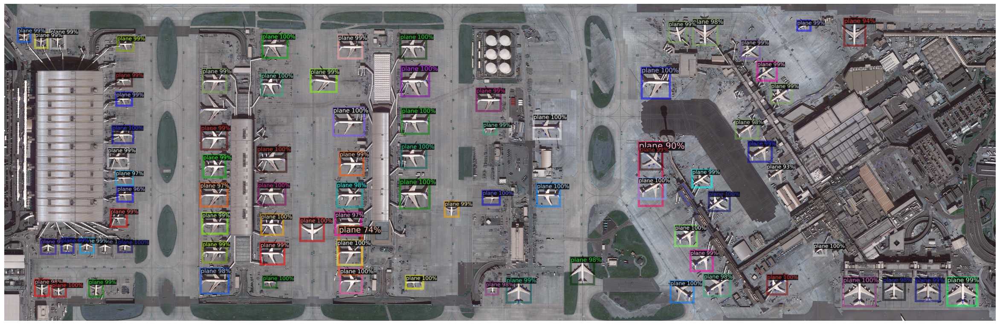

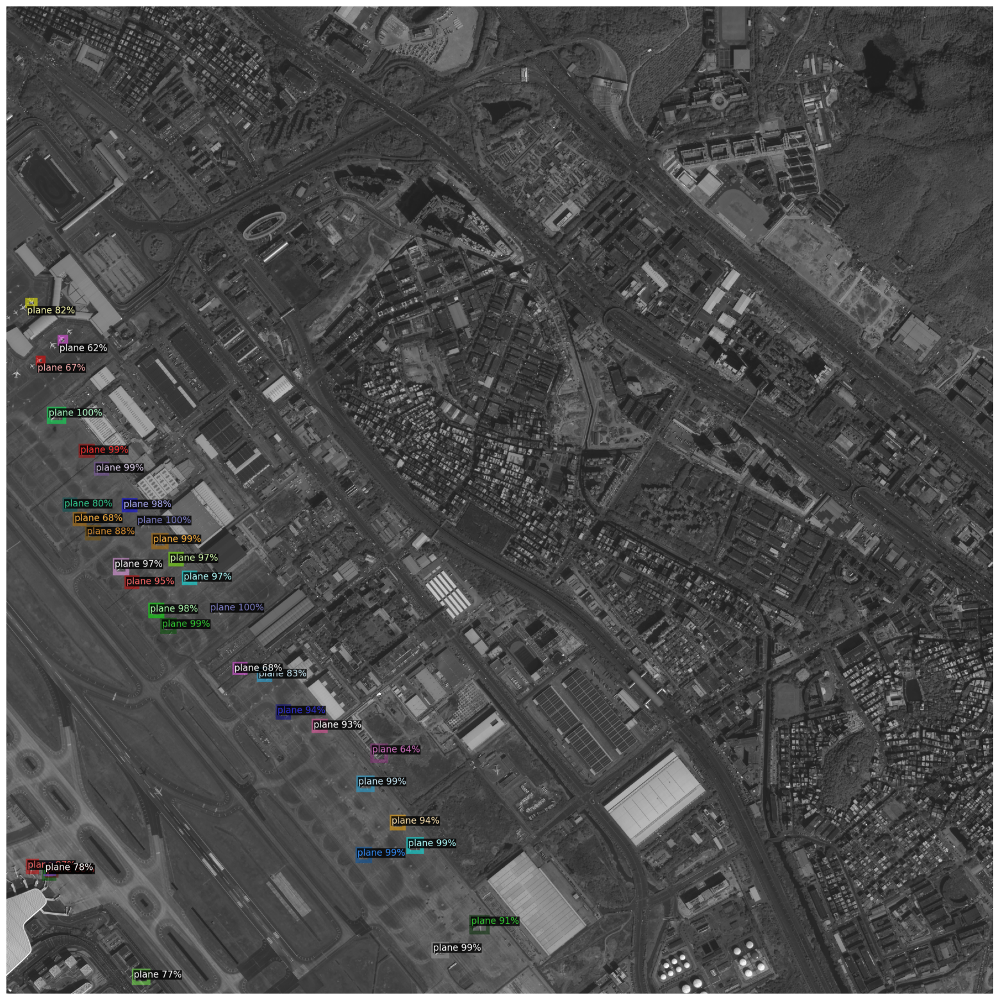

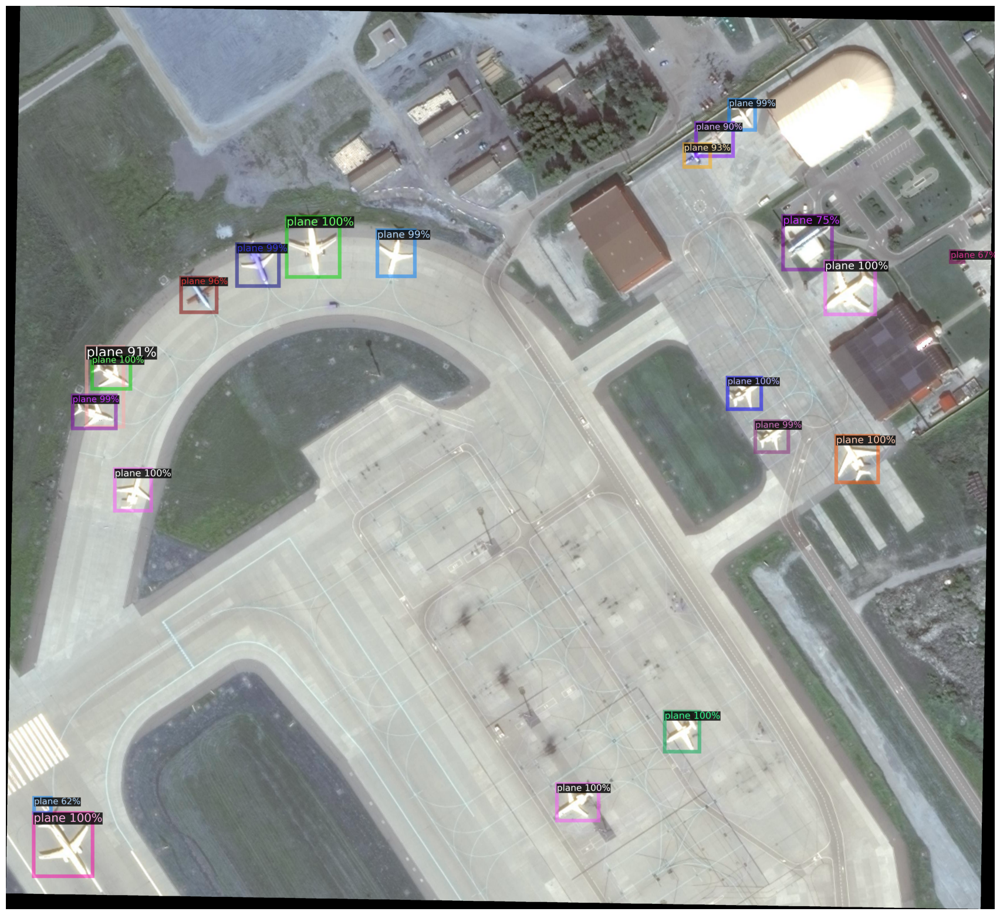

In [39]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''
testset = DatasetCatalog.get("data_detection_test")
for sample in random.sample(testset, 3):
    img = cv2.imread(sample["file_name"])

    # Perform inference
    outputs = predictor(img)

    # Visualize the predictions
    v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(30, 20))  # Set the figure size
    plt.imshow(v.get_image()[:, :, ::-1])  # Convert image back from BGR to RGB
    plt.axis("off")  # Hide axes for better visualization
    plt.show()

In [38]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''
evaluator = COCOEvaluator("data_detection_train", cfg, False, output_dir=cfg.OUTPUT_DIR)

train_loader = build_detection_test_loader(cfg, "data_detection_train")

results = inference_on_dataset(trainer.model, train_loader, evaluator)

print("AP at IoU=0.50:", results["bbox"]["AP50"])

WARNING [12/01 14:29:40 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/01 14:29:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/01 14:29:41 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/01 14:29:41 d2.data.common]: Serializing 198 elements to byte tensors and concatenating them all ...
[12/01 14:29:41 d2.data.common]: Serialized dataset takes 15.48 MiB
[12/01 14:29:41 d2.evaluation.evaluator]: Start inference on 198 batches
[12/01 14:29:46 d2.evaluation.evaluator]: Inference done 11/198. Dataloading: 0.0296 s/iter. Inference: 0.0488 s/iter. Eval: 0.0003 s/iter. Total: 0.0786 s/iter. ETA=0:00:14
[12/01 14:29:51 d2.evaluation.evaluator]: Inference done 70/198. Dataloading: 0.0377 s/iter. Inference: 0.0477 s/

### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


'\n# Bring any changes and updates regarding the improvement in here\n'

## Part 2: Semantic Segmentation

### Data Loader

In [40]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use the mask attribute of detectron2.utils.visualizer.GenericMask
#     to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import GenericMask
def get_instance_sample(data, idx, img=None):
    # Load the image if not provided
    if img is None:
        img = cv2.imread(data["file_name"])
        if img is None:
            raise ValueError(f"Image not found: {data['file_name']}")
    
    # Get the target bounding box and segmentation info
    bbox = data["annotations"][idx]["bbox"]
    segmentation = data["annotations"][idx]["segmentation"]
    
    # Crop the image using the bounding box
    x, y, w, h = map(int, bbox)
    obj_img = img[y:y+h, x:x+w]
    
    # Convert segmentation to binary mask
    mask = GenericMask(segmentation, img.shape[0], img.shape[1]).mask
    obj_mask = mask[y:y+h, x:x+w]  # Crop the mask to the bounding box
    
    return obj_img, obj_mask

In [42]:
def preprocess_and_save(data_list, output_dir, img_size=(128, 128), augment=False):
    try:
        os.makedirs(output_dir, exist_ok=False)
    except:
        return

    instance_map = []
    preloaded_data = []

    for data_idx, data in tqdm(enumerate(data_list)):
        img_path = data["file_name"]
        img = cv2.imread(img_path)
        if img is None:
            raise ValueError(f"Cannot find image: {img_path}")

        for ann_idx, annotation in enumerate(data["annotations"]):
            bbox = annotation["bbox"]
            segmentation = annotation["segmentation"]

            # Crop the image based on bounding box
            x, y, w, h = map(int, bbox)
            obj_img = img[y:y + h, x:x + w]

            # Convert segmentation to binary mask and crop it
            mask = GenericMask(segmentation, img.shape[0], img.shape[1]).mask
            obj_mask = mask[y:y + h, x:x + w]

            # Resize to a fixed size
            obj_img_resized = cv2.resize(obj_img, img_size, interpolation=cv2.INTER_LINEAR)
            obj_mask_resized = cv2.resize(obj_mask, img_size, interpolation=cv2.INTER_NEAREST)

            # Apply optional augmentations
            if augment:
                obj_img_resized, obj_mask_resized = apply_augmentation(obj_img_resized, obj_mask_resized)
            
            # Normalize and convert to tensors (ensure contiguous array before conversion)
            obj_img_tensor = torch.tensor(obj_img_resized.copy(), dtype=torch.float32).permute(2, 0, 1) / 255.0
            obj_mask_tensor = torch.tensor(obj_mask_resized.copy(), dtype=torch.float32).unsqueeze(0)

            # Save tensors to disk as .pt files
            sample_name = f"{data_idx}_{ann_idx}.pt"
            torch.save((obj_img_tensor, obj_mask_tensor), os.path.join(output_dir, sample_name))

            # Keep track of processed instances
            instance_map.append(sample_name)

    return instance_map


def apply_augmentation(img, mask):
    """
    Apply random augmentation transforms to an image and its mask.
    """
    # Random horizontal flip
    if random.random() > 0.5:
        img = np.fliplr(img)
        mask = np.fliplr(mask)

    # Random vertical flip
    if random.random() > 0.5:
        img = np.flipud(img)
        mask = np.flipud(mask)

    return img, mask

class PreloadedPlaneDataset(Dataset):
    def __init__(self, instance_map, data_dir):
        """
        Dataset for preprocessed data stored on disk.
        Args:
            instance_map (list): List of saved file names (e.g., ["0_0.pt", "0_1.pt"...]).
            data_dir (str): Directory where the preprocessed data is stored.
        """
        self.instance_map = instance_map
        self.data_dir = data_dir

    def __len__(self):
        return len(self.instance_map)

    def __getitem__(self, idx):
        """
        Fetch preprocessed tensors from disk.
        """
        sample_name = self.instance_map[idx]
        sample_path = os.path.join(self.data_dir, sample_name)

        # Load preprocessed data directly
        img_tensor, mask_tensor = torch.load(sample_path)
        return img_tensor, mask_tensor


def get_preloaded_plane_dataset(data_dir, batch_size=2, num_workers=0):
    """
    Create DataLoader for preprocessed datasets.
    """
    instance_map = [f for f in os.listdir(data_dir) if f.endswith(".pt")]
    dataset = PreloadedPlaneDataset(instance_map, data_dir)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True, pin_memory=True)
    return loader, dataset

In [44]:
data = DatasetCatalog.get("data_detection_train")
output_dir = "./preprocessed_data"
img_size = (128, 128)

instance_map = preprocess_and_save(data, output_dir, img_size=(128, 128), augment=False)

loader, dataset = get_preloaded_plane_dataset(output_dir, batch_size=4, num_workers=0)

# for img_batch, mask_batch in tqdm(loader):
#     print("Image Batch Shape:", img_batch.shape)
#     print("Mask Batch Shape:", mask_batch.shape)

In [45]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import cv2
import torch
import numpy as np
from detectron2.utils.visualizer import GenericMask

class PlaneDataset(Dataset):
    def __init__(self, set_name, data_list, img_size=(128, 128), in_memory=True):
        self.img_size = img_size  # Fixed size of (128, 128)
        self.set_name = set_name
        self.data_list = data_list
        self.instance_map = []
        self.in_memory = in_memory

        # Preloading transforms (incl. resizing and normalization)
        self.transforms = transforms.Compose([
            transforms.ToTensor(),  # Converts to tensor and normalizes pixel values (0-1)
        ])

        # Build instance map
        for i, d in enumerate(self.data_list):
            for j in range(len(d['annotations'])):
                self.instance_map.append([i, j])

        if self.in_memory:
            # Preload images into memory (keeps entire dataset in RAM if feasible)
            self.loaded_data = []
            for d in self.data_list:
                img = cv2.imread(d["file_name"])
                self.loaded_data.append(img)
        else:
            self.loaded_data = None

    def __len__(self):
        return len(self.instance_map)

    def numpy_to_tensor(self, img, mask):
        img = self.transforms(img)  # Convert to tensor
        mask = torch.tensor(mask, dtype=torch.float)
        return img, mask

    def __getitem__(self, idx):
        data_idx, ann_idx = self.instance_map[idx]
        data = self.data_list[data_idx]

        # Load the image from disk or memory
        img = self.loaded_data[data_idx] if self.in_memory else cv2.imread(data["file_name"])

        if img is None:
            raise ValueError(f"Image not found: {data['file_name']}")

        # Process the segmentation and bounding box
        obj_img, obj_mask = get_instance_sample(data, ann_idx, img=img)

        # Resize image and mask to fixed size
        obj_img_resized = cv2.resize(obj_img, self.img_size, interpolation=cv2.INTER_LINEAR)
        obj_mask_resized = cv2.resize(obj_mask, self.img_size, interpolation=cv2.INTER_NEAREST)
        obj_mask_resized = np.expand_dims(obj_mask_resized, axis=0)  # Add channel axis for masks

        # Convert to tensors
        img_tensor = torch.tensor(obj_img_resized, dtype=torch.float32).permute(2, 0, 1) / 255.0  # Normalize to [0, 1]
        mask_tensor = torch.tensor(obj_mask_resized, dtype=torch.float32)

        return img_tensor, mask_tensor


def get_plane_dataset(set_name='train', batch_size=2, num_workers=0, img_size=(128, 128), in_memory=True):
    """
    Returns DataLoader and Dataset for the given set.
    """
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))  # Load detectron2 data
    dataset = PlaneDataset(set_name, my_data_list, img_size=img_size, in_memory=in_memory)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=True, shuffle=True)
    return loader, dataset

In [ ]:
# Assuming get_plane_dataset is already defined
train_loader, train_dataset = get_plane_dataset(set_name="train", batch_size=4)

for img_batch, mask_batch in train_loader:
    print("Image Batch Shape:", img_batch.shape)
    print("Mask Batch Shape:", mask_batch.shape)


Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Mask Batch Shape: torch.Size([4, 1, 128, 128])
Image Batch Shape: torch.Size([4, 3, 128, 128])
Ma

KeyboardInterrupt: 

### Network

In [47]:
import torch
import torch.nn as nn

# Basic convolution block with optional BatchNorm and ReLU
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size=3, activation=True):
        super(conv, self).__init__()
        padding = (kernel_size - 1) // 2  # To keep the spatial dimensions constant
        self.layer = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size, padding=padding),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True) if activation else nn.Identity(),
        )

    def forward(self, x):
        return self.layer(x)

# Downsampling block (conv + maxpool)
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            conv(out_ch, out_ch),
            nn.MaxPool2d(2)
        )

    def forward(self, x):
        return self.layer(x)

# Upsampling block with concat skip connections
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch // 2, kernel_size=2, stride=2)

        self.conv = nn.Sequential(
            conv(in_ch, out_ch),
            conv(out_ch, out_ch)
        )

    def forward(self, x1, x2):
        # Upsample the smaller feature map (decoder)
        x1 = self.up(x1)
        # Ensure feature maps are compatible for concatenation
        diffY = x2.size(2) - x1.size(2)
        diffX = x2.size(3) - x1.size(3)
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])

        # Concatenate encoder and decoder features
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

# Main UNet-like Model
class MyModel(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, bilinear=False):
        super(MyModel, self).__init__()

        # Encoder: Downsampling path
        self.inc = conv(n_channels, 64)  # Initial convolution layer
        self.down1 = down(64, 128)
        self.down2 = down(128, 256)
        self.down3 = down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = down(512, 1024 // factor)  # Bottom layer

        # Decoder: Upsampling path with skip connections
        self.up1 = up(1024, 512 // factor, bilinear)
        self.up2 = up(512, 256 // factor, bilinear)
        self.up3 = up(256, 128 // factor, bilinear)
        self.up4 = up(128, 64, bilinear)

        # Output layer: Final 1x1 convolution to get desired output
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        # Encoder path
        x1 = self.inc(x)  # Initial Conv
        x2 = self.down1(x1)  # Downsample 1
        x3 = self.down2(x2)  # Downsample 2
        x4 = self.down3(x3)  # Downsample 3
        x5 = self.down4(x4)  # Bottom of the U-Net

        # Decoder path with skip connections
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        # Output layer
        logits = self.outc(x)
        return logits

### Training

In [52]:
class DiceLoss(nn.Module):
    def __init__(self):
        super(DiceLoss, self).__init__()

    def forward(self, logits, targets):
        smooth = 1.0  # Smoothing factor to avoid division by zero
        logits = torch.sigmoid(logits)  # Convert logits to probabilities
        intersection = (logits * targets).sum(dim=(2, 3))  # Summed pixel-wise intersection
        union = logits.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))  # Summed union
        dice_score = (2.0 * intersection + smooth) / (union + smooth)  # Dice coefficient
        loss = 1.0 - dice_score  # Dice loss (1 - Dice coefficient)
        return loss.mean()

class BCEDiceLoss(nn.Module):
    def __init__(self):
        super(BCEDiceLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()

    def forward(self, logits, targets):
        bce_loss = self.bce(logits, targets)  # BCE Loss
        dice_loss = self.dice(logits, targets)  # Dice Loss
        return bce_loss + dice_loss  # Weighted sum (BCE + Dice)

In [57]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''

# Set the hyperparameters
num_epochs = 40
batch_size = 4
learning_rate = 0.01
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, dataset = get_preloaded_plane_dataset(output_dir, batch_size=4, num_workers=0)
# loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD

scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size=30, gamma=0.5)  # LR Scheduler


# num_epochs = 30
# batch_size = 4
# learning_rate = 0.0001
# weight_decay = 1e-4

# model = MyModel().cuda()
# loader, dataset = get_preloaded_plane_dataset(output_dir, batch_size=4, num_workers=0)

# crit = BCEDiceLoss()  # Combined BCE + Dice Loss
# optim = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size=10, gamma=0.5)  # LR Scheduler

# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    # print(img.shape, pred.shape, mask.shape)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  scheduler.step()
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  if epoch % 5 == 0:
    torch.save(model.state_dict(), '{}/output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))

'''
# Saving the final model
'''
torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


  0%|          | 0/1731 [00:00<?, ?it/s]

C:\Users\Billy\AppData\Local\Temp\ipykernel_32120\3843027728.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  img_tensor, mask_tensor = torch.load(sample_path)
C:\Users\

Epoch: 0, Loss: 0.2590216100215912


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 1, Loss: 0.19304051995277405


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 2, Loss: 0.1786302775144577


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 3, Loss: 0.16849367320537567


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 4, Loss: 0.16161403059959412


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 5, Loss: 0.1554863005876541


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 6, Loss: 0.1502368003129959


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 7, Loss: 0.14553646743297577


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 8, Loss: 0.14123308658599854


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 9, Loss: 0.13715608417987823


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 10, Loss: 0.13330155611038208


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 11, Loss: 0.12891587615013123


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 12, Loss: 0.12437689304351807


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 13, Loss: 0.12059696018695831


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 14, Loss: 0.11729536950588226


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 15, Loss: 0.11452597379684448


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 16, Loss: 0.11147317290306091


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 17, Loss: 0.10753792524337769


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 18, Loss: 0.10636819899082184


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 19, Loss: 0.10226105153560638


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 20, Loss: 0.09810654073953629


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 21, Loss: 0.09459187090396881


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 22, Loss: 0.09233404695987701


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 23, Loss: 0.09010551124811172


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 24, Loss: 0.08703581243753433


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 25, Loss: 0.08450328558683395


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 26, Loss: 0.08164732903242111


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 27, Loss: 0.07969945669174194


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 28, Loss: 0.07779853045940399


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 29, Loss: 0.07544129341840744


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 30, Loss: 0.06679253280162811


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 31, Loss: 0.0634484738111496


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 32, Loss: 0.0617651641368866


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 33, Loss: 0.06031796708703041


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 34, Loss: 0.05939873680472374


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 35, Loss: 0.058438386768102646


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 36, Loss: 0.057375866919755936


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 37, Loss: 0.056235089898109436


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 38, Loss: 0.055390581488609314


  0%|          | 0/1731 [00:00<?, ?it/s]

Epoch: 39, Loss: 0.05501323193311691


### Evaluation and Visualization

In [58]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''

batch_size = 8
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_preloaded_plane_dataset(output_dir, batch_size=4, num_workers=0)

total_iou = 0
num_samples = 0
threshold = 0.5
for (img, mask) in tqdm(loader):
  with torch.no_grad():
    img = img.cuda()
    mask = mask.cuda()
    mask = torch.unsqueeze(mask,1)
    pred = model(img)

    '''
    ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
    '''
    pred_binary = (pred > threshold).float()  # Threshold to binary mask
    intersection = (pred_binary * mask).sum(dim=(1, 2, 3))  # Sum over H, W
    union = ((pred_binary + mask) > 0).float().sum(dim=(1, 2, 3))  # Union over H, W
    batch_iou = intersection / (union + 1e-6)  # Avoid division by zero

    total_iou += batch_iou.sum().item()  # Accumulate IoU
    num_samples += batch_iou.size(0)
mean_iou = total_iou / num_samples
print("\n #images: {}, Mean IoU: {:.4f}".format(num_samples, mean_iou))


C:\Users\Billy\AppData\Local\Temp\ipykernel_32120\2021925335.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('{}/output/final_segmentati

  0%|          | 0/1731 [00:00<?, ?it/s]

C:\Users\Billy\AppData\Local\Temp\ipykernel_32120\3843027728.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  img_tensor, mask_tensor = torch.load(sample_path)



 #images: 6921, Mean IoU: 43.0862


C:\Users\Billy\AppData\Local\Temp\ipykernel_32120\3843027728.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  img_tensor, mask_tensor = torch.load(sample_path)


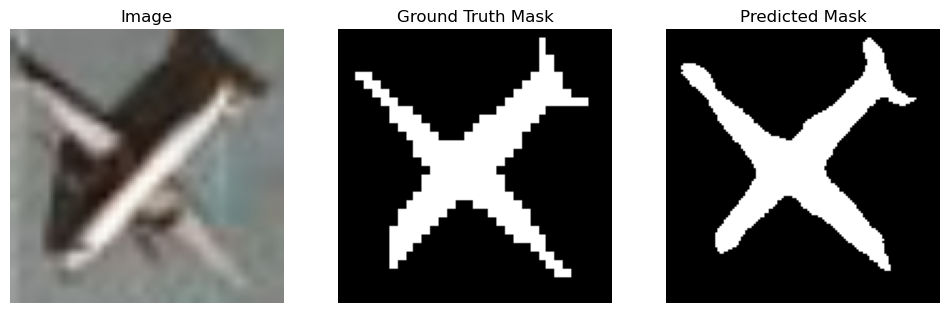

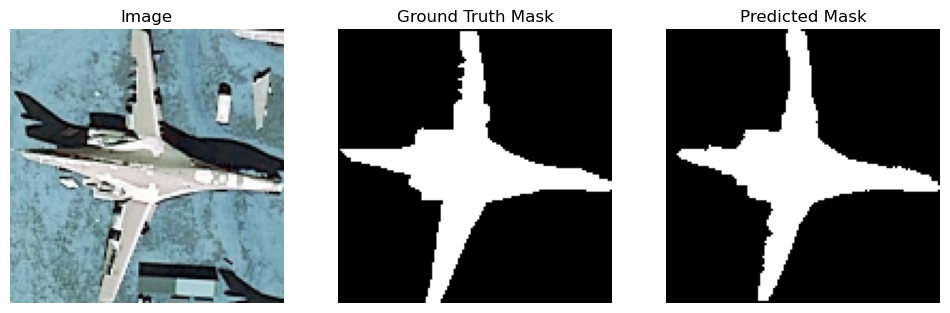

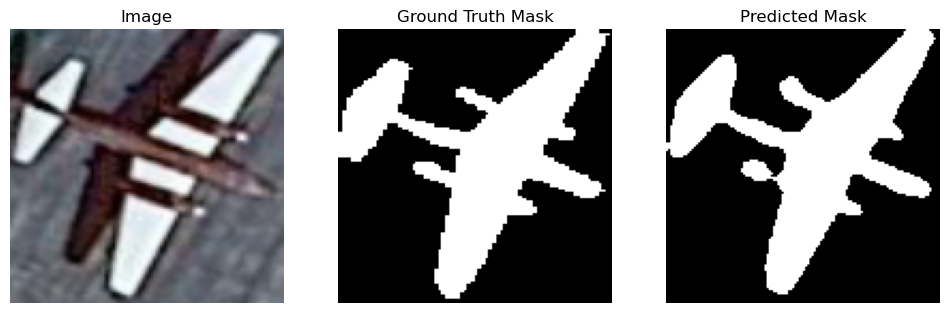

In [63]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
# Visualization of sample outputs
import matplotlib.pyplot as plt

# Visualize 3 random samples
img, mask = next(iter(loader))  # Fetch a single batch
img, mask = img.cuda(), mask.cuda()
mask = torch.unsqueeze(mask, 1)
with torch.no_grad():
    pred = model(img)

# Convert predictions and ground truth for visualization
pred_binary = (pred > 0.5).float()  # Threshold prediction to binary

for i in range(3):  # Visualize 3 samples
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img[i].permute(1, 2, 0).cpu().numpy())  # Convert to HWC format
    plt.title("Image")
    plt.axis("off")

    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(mask[i].squeeze().cpu().numpy(), cmap="gray")  # Fix applied here
    plt.title("Ground Truth Mask")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(pred_binary[i].squeeze().cpu().numpy(), cmap="gray")  # Fix also here
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()

## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [80]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# It is better to keep everything (as well as the output of this funcion) on gpu as tensors to speed up the operations.
# pred_mask is the instance segmentation result and should have different values for different planes.
# TODO: approx 35 lines
'''

def get_prediction_mask(data, img_size=(128, 128)):
    bb = []
    aa = []
    mask1 = []
    mask2 = []
    mask3 = []
    # ---------- Step 1: Load the image ----------
    img_path = data["file_name"]  # Path to the image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    height, width, _ = img.shape

    # Convert to torch tensor (in Detectron2's format)
    img_tensor = torch.tensor(img).float().permute(2, 0, 1).unsqueeze(0).cuda()  # Shape: (1, C, H, W)

    # ---------- Step 2: Get object detections using Detectron2 ----------
    outputs = predictor(img)  # Detectron2 predictor output
    instances = outputs["instances"]
    boxes = instances.pred_boxes.tensor  # Detected bounding boxes
    n_instances = len(boxes)  # Number of detected instances
    
    # Initialize prediction mask
    pred_mask = torch.zeros((height, width), dtype=torch.float32, device="cuda")
    
    # ---------- Step 3: Process each region (bounding box) ----------
    for i in range(n_instances):
        # Get the bounding box and crop the image
        box = boxes[i].int()  # Convert box to integers
        x1, y1, x2, y2 = box[0].item(), box[1].item(), box[2].item(), box[3].item()
        
        # Crop the region corresponding to the bounding box
        cropped_img = img[y1:y2, x1:x2]  # Crop (H, W, C)
        aa.append(cropped_img)
        
        cropped_img_tensor = torch.tensor(cropped_img).cuda().float().permute(2, 0, 1)  # Shape: (C, H, W)
        
        # Resize to match model input dimensions (example: 128x128)
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize(img_size),
            transforms.ToTensor()
        ])

        obj_img_resized = cv2.resize(cropped_img, img_size, interpolation=cv2.INTER_LINEAR)
        cropped_img_tensor = torch.tensor(obj_img_resized, dtype=torch.float32).permute(2, 0, 1) / 255.0
        cropped_img_tensor = cropped_img_tensor.unsqueeze(0)
        cropped_img_tensor = cropped_img_tensor.to('cuda')
        # cropped_img_tensor = transform(cropped_img_tensor.cpu()).cuda().unsqueeze(0)  # Shape: (1, C, H, W)
        bb.append(cropped_img_tensor)

        # ---------- Step 4: Pass through UNet-like model for segmentation ----------
        with torch.no_grad():
            pred_instance = model(cropped_img_tensor)  # Output: (1, 1, H, W)
            pred_instance = torch.sigmoid(pred_instance).squeeze(0).squeeze(0)  # Shape: (H, W)
            
        mask1.append(pred_instance.squeeze())
        # Resize predicted mask back to original bounding box size
        pred_instance_resized = torch.nn.functional.interpolate(
            pred_instance.unsqueeze(0).unsqueeze(0), size=(y2 - y1, x2 - x1), mode="bilinear", align_corners=False
        ).squeeze(0).squeeze(0)  # Shape: (H_box, W_box)
        mask2.append(pred_instance_resized)
        # Threshold the mask (remove low probabilities)
        pred_instance_binary = (pred_instance_resized > 0.5).float()
        mask3.append(pred_instance_binary)
        # Insert the instance mask into the final mask tensor at the correct location
        pred_mask[y1:y2, x1:x2] = torch.where(pred_instance_binary > 0, i + 1, pred_mask[y1:y2, x1:x2])

    # ---------- Step 5: Prepare ground-truth mask ----------
    if "annotations" in data and len(data["annotations"]) > 0:
        # Create ground-truth mask based on annotations
        gt_mask = torch.zeros((height, width), dtype=torch.float32, device="cuda")
        annotations = data["annotations"]
        
        for ann in annotations:
            segmentation = ann['segmentation']
            mask = GenericMask(segmentation, height, width).mask
            gt_mask += torch.tensor(mask, device="cuda").float()  # Overlapping area will accumulate
    else:
        # If no ground truth is given
        gt_mask = torch.zeros((height, width), dtype=torch.float32, device="cuda")

    return img_tensor.squeeze(0), gt_mask, pred_mask#, bb,mask1,mask2,mask3, aa # gt_mask could be all zero when the ground truth is not given.

11


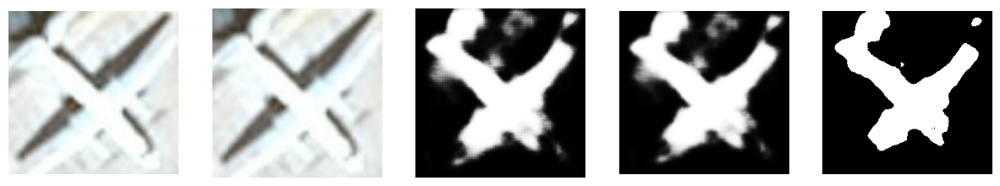

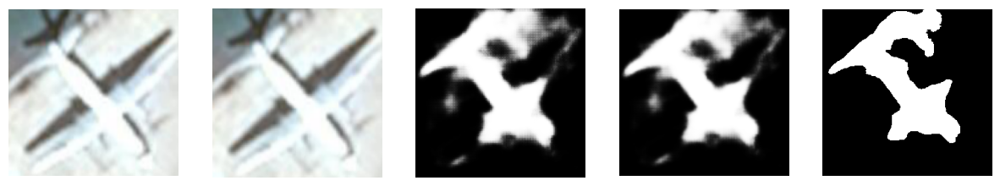

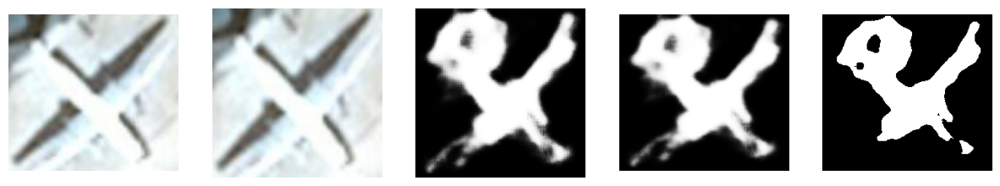

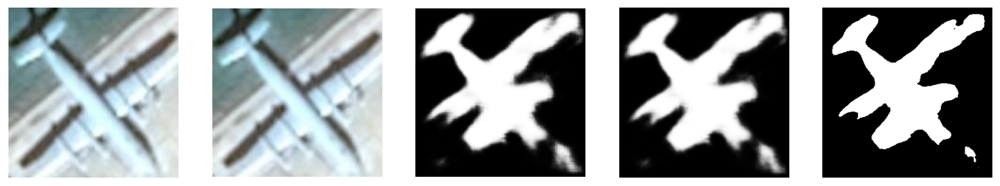

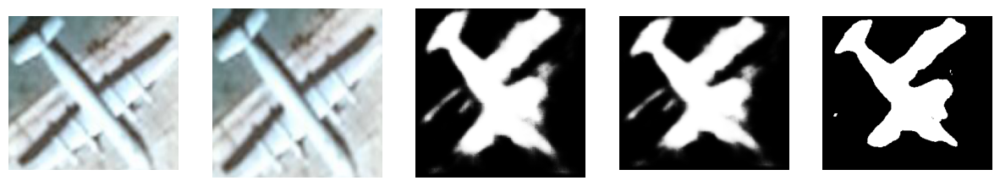

...

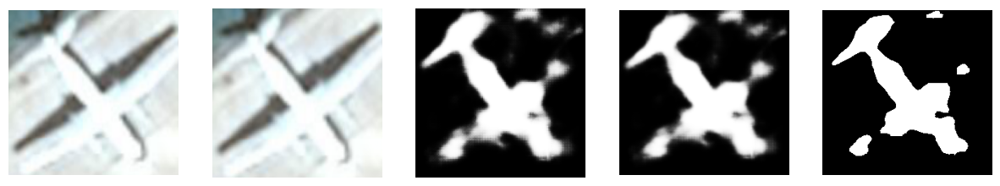

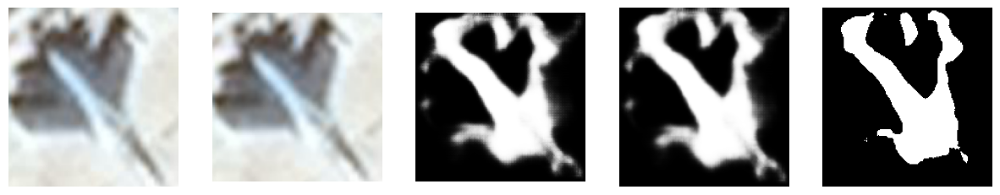

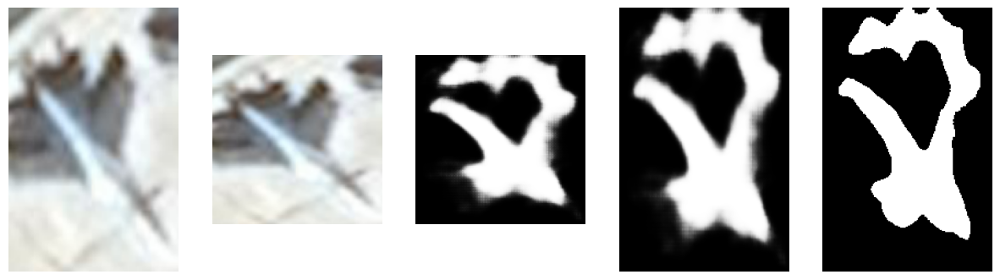

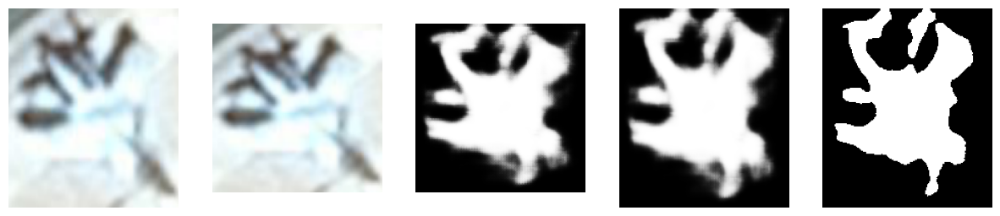

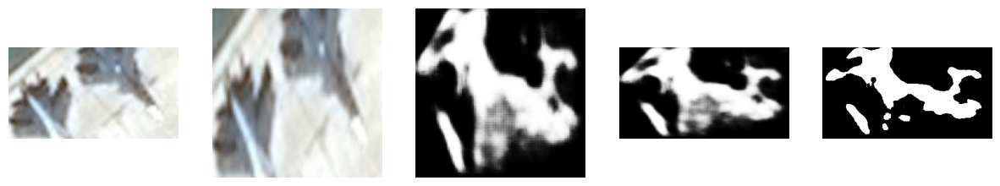

In [79]:
ds = DatasetCatalog.get("data_detection_test")
for sample in random.sample(ds, 1):
    img, gt_mask, pred_mask,bb,mask1,mask2,mask3,aa = get_prediction_mask(sample)

print(len(bb))
for i in range(len(bb)):
    # Convert masks to NumPy
    bb1 = bb[i].squeeze(0).permute(1, 2, 0).cpu().numpy()
    aa1 = aa[i]
    mask11 = mask1[i].cpu().numpy()
    mask22 = mask2[i].cpu().numpy()
    mask33 = mask3[i].cpu().numpy()

    # Plot side-by-side
    plt.figure(figsize=(15, 5))

    # Plot input image
    plt.subplot(1, 5, 1)
    plt.imshow(aa1)
    plt.axis("off")

    # Plot input image
    plt.subplot(1, 5, 2)
    plt.imshow(bb1)
    plt.axis("off")

    # Plot ground truth mask
    plt.subplot(1, 5, 3)
    plt.imshow(mask11, cmap="gray")
    plt.axis("off")

    # Plot predicted mask
    plt.subplot(1, 5, 4)
    plt.imshow(mask22, cmap="gray")  # Use colormap for instances
    plt.axis("off")
    
    # Plot predicted mask
    plt.subplot(1, 5, 5)
    plt.imshow(mask33, cmap="gray")  # Use colormap for instances
    plt.axis("off")

    plt.show()

### Visualization and Submission

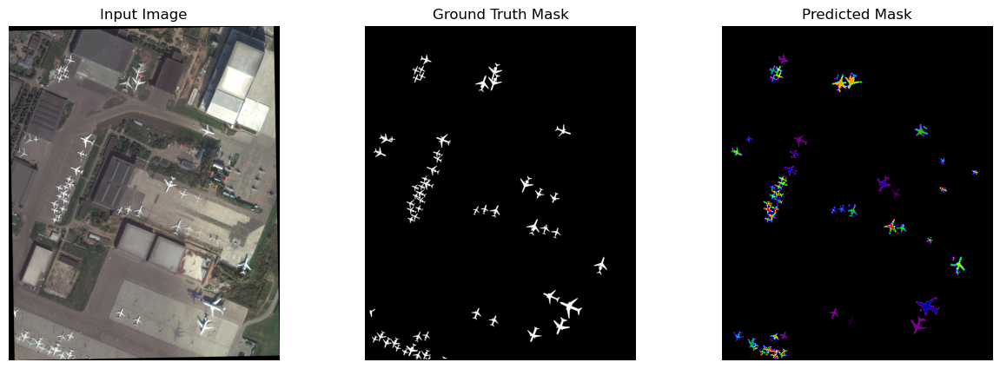

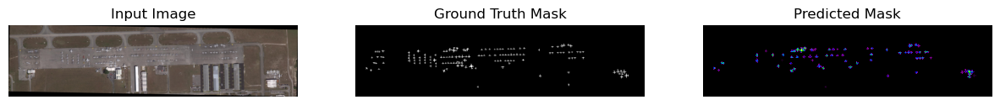

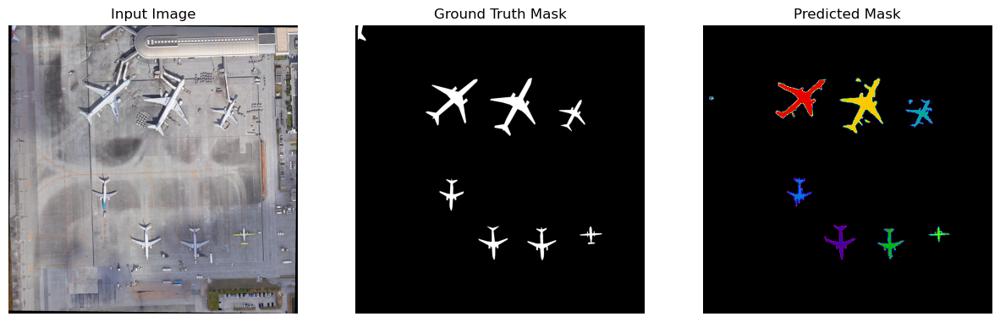

In [81]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
ds = DatasetCatalog.get("data_detection_train")
for sample in random.sample(ds, 3):
    img, gt_mask, pred_mask = get_prediction_mask(sample)
    
    img_np = img.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format on CPU
    img_np = img_np.astype(np.uint8)  # Ensure the image is in uint8 format

    # Convert masks to NumPy
    gt_mask_np = gt_mask.cpu().numpy()
    pred_mask_np = pred_mask.cpu().numpy()

    # Plot side-by-side
    plt.figure(figsize=(15, 5))

    # Plot input image
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title("Input Image")
    plt.axis("off")

    # Plot ground truth mask
    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask_np, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    # Plot predicted mask
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask_np, cmap="nipy_spectral")  # Use colormap for instances
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()

In [82]:
img.shape, gt_mask.shape, pred_mask.shape

(torch.Size([3, 2458, 2463]),
 torch.Size([2458, 2463]),
 torch.Size([2458, 2463]))

In [83]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [85]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
df = pd.DataFrame(preddic)
df['ImageId'] = df['ImageId'].apply(lambda x: x.split("\\")[-1])
df.to_csv(pred_file, index=False)
pred_file.close()


  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

### Network

### Training

### Evaluation and Visualization